# Image Data Augmentation

Topic : Augmentating an image with **"imgaug"** takes only a few lines of code.  
Caution : **imgaug** expects images to be numpy arrays and works best with dtype uint8, i.e. when the array's values are in the range 0 to 255.  


[Augmenters보러가기](https://imgaug.readthedocs.io/en/latest/source/overview_of_augmenters.html)

# 0. Installation

In [1]:
!pip install imgaug

     |████████████████████████████████| 948 kB 459 kB/s eta 0:00:01     |████████████████████████▏       | 716 kB 459 kB/s eta 0:00:01
     |████████████████████████████████| 30.2 MB 22.7 MB/s eta 0:00:01
     |████████████████████████████████| 3.3 MB 30.3 MB/s eta 0:00:01
     |████████████████████████████████| 1.0 MB 37.4 MB/s eta 0:00:01
     |████████████████████████████████| 1.9 MB 28.8 MB/s eta 0:00:01
     |████████████████████████████████| 4.4 MB 36.3 MB/s eta 0:00:01
     |████████████████████████████████| 171 kB 34.4 MB/s eta 0:00:01


# 1. Load One Image

In [13]:
import imageio
import imgaug as ia
import os
import pandas as pd
%matplotlib inline

images_dir_path = '/opt/ml/input/data/train'
img_path= os.path.join(images_dir_path, 'images')
img_csv_path = pd.read_csv(os.path.join(images_dir_path, 'train.csv'))

In [22]:
#Just One Image

IMG_PATH = os.path.join(img_path, img_csv_path.iloc[0]['path'])
#print(IMG_PATH)
file_list = os.listdir(IMG_PATH)
one_file = file_list[2]
file_path = os.path.join(IMG_PATH, one_file)

Populating the interactive namespace from numpy and matplotlib
Original:


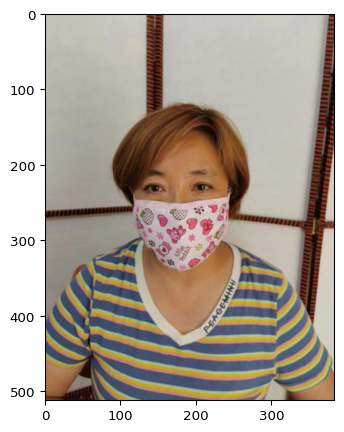

(512, 384, 3)

In [31]:
%pylab inline
import matplotlib.pyplot as plt
import matplotlib.image as mpimg


image = imageio.imread(file_path)

print("Original:")
ia.imshow(image)

image.shape

# 2. Augment the Image

Descriptions : **imgaug** contatins many augmentation techniques in the form of classes deriving from the **Augmenter** parnet class.  
  
- 1. *Affine* 을 사용해서 적용한다.
    - We keep it simple here and use that technique to rotate the image by a random value between -25° and +25°

Augmented:


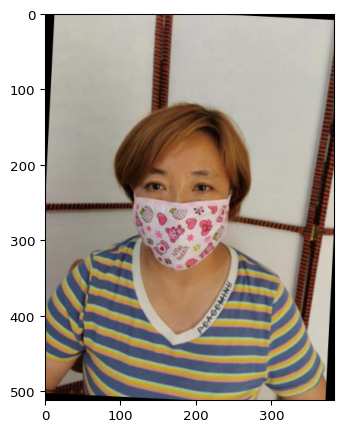

In [37]:
from imgaug import augmenters as iaa
ia.seed(4)

rotate = iaa.Affine(rotate=(-30, 30))
image_aug = rotate(image=image)

print("Augmented:")
ia.imshow(image_aug)

## 2-1. Augment a Batch of Image
Desciptions : We can achieve this using the same code as above, just changing the signular parameter image to images.  

- we create a batch here by just copying the original image several times and then feeding it through our rotation augmenter  
- To visualize our results, we use numpy's hstack() function

Results : all of the images in the batch were automatically rotated by different amounts.  
Reasons : 
''' rotate = iaa.Affine(rotate=(-25, 25)) '''

Other Methods : a list rotate=[-25, -15, 0] to rotate by -25° or by -15° or by 0°

Augmented batch : 


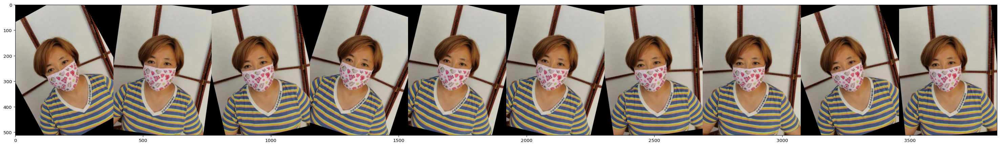

In [38]:
import numpy as np

image_list = [image for _ in range(10)]
images_aug = rotate(images= image_list)

print("Augmented batch : ")
ia.imshow(np.hstack(images_aug))

# 3. Crop & GaussianNoise

Augmented:


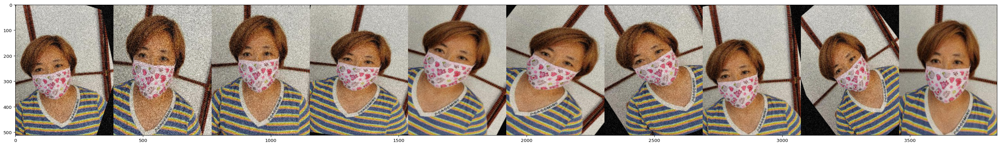

In [39]:
seq = iaa.Sequential([
    iaa.Affine(rotate=(-25, 25)),
    iaa.AdditiveGaussianNoise(scale=(10, 60)),
    iaa.Crop(percent=(0, 0.2))
])

images_aug = seq(images=images_aug)

print("Augmented:")
ia.imshow(np.hstack(images_aug))

Augmented:


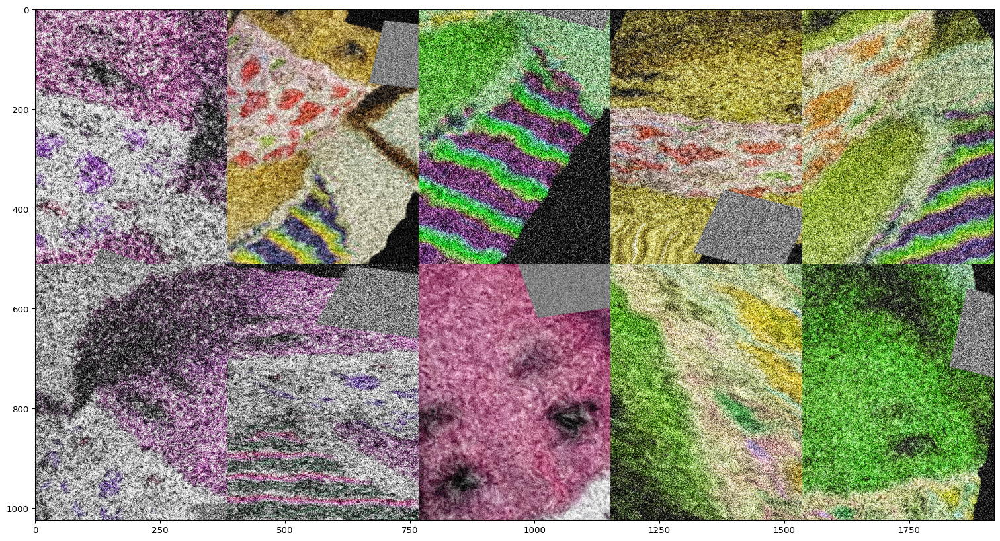

In [43]:
seq = iaa.Sequential([
    iaa.Affine(rotate=(-25, 25)),
    iaa.AdditiveGaussianNoise(scale=(30, 90)),
    iaa.Crop(percent=(0, 0.4))
], random_order=True)

images_aug = seq(images=images_aug)
print("Augmented:")
ia.imshow(ia.draw_grid(images_aug, cols=4, rows=2))

# 4. Use Many Augmentation Techniques Simultaneously

Augmented:


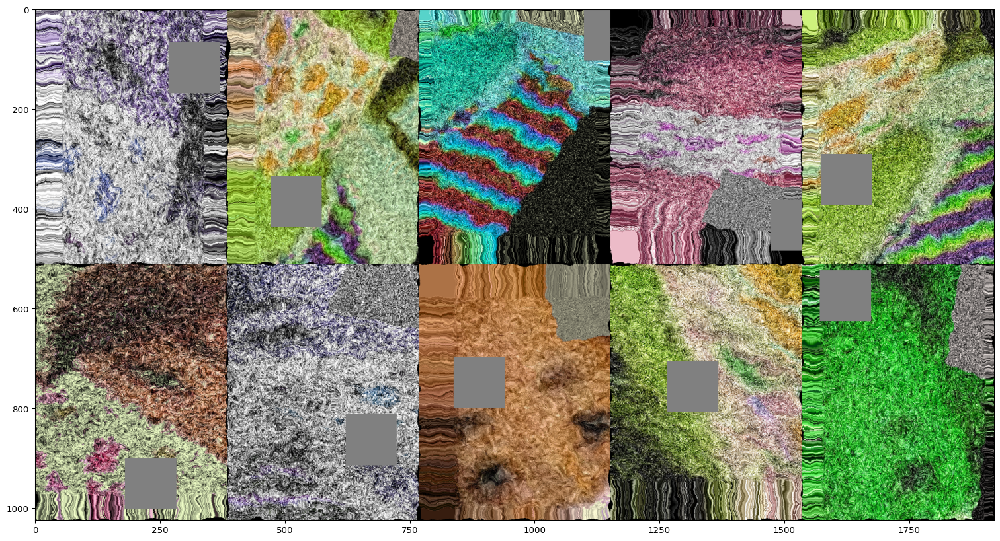

In [44]:
seq = iaa.Sequential([
    iaa.CropAndPad(percent=(-0.2, 0.2), pad_mode="edge"),  # crop and pad images
    iaa.AddToHueAndSaturation((-60, 60)),  # change their color
    iaa.ElasticTransformation(alpha=90, sigma=9),  # water-like effect
    iaa.Cutout()  # replace one squared area within the image by a constant intensity value
], random_order=True)

images_aug = seq(images=images_aug)
print("Augmented:")
ia.imshow(ia.draw_grid(images_aug, cols=4, rows=2))